# Final Model Sample Testing

In [1]:
import tensorflow as tf
import tensorflow.keras as Keras
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.image import per_image_standardization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from skimage import filters

from model_utils import generate_image_paths 
from model_utils import artificial_lunar_landscapes

from model_utils_sobel import generate_image_paths as generate_image_paths_processed
from model_utils_sobel import artificial_lunar_landscapes as artificial_lunar_landscapes_processsed

import re
import os
import cv2

### Settings

In [2]:
batch_size = 1
image_size = (480,720,1)
image_size_color = (480,720,3)
input_dir = 'C:/SynologyDrive/Programming/msds-thesis-data/data-ml/split-data/bennu-validation'
input_processed_path = 'C:/SynologyDrive/Programming/msds-thesis-data/data-ml/split-data/bennu-validation'

### Generator

In [3]:
# ORIGINAL 
"""
input_dir, input_img_paths = generate_image_paths(
    input_dir=input_dir
)

test_generator = artificial_lunar_landscapes(
    batch_size=batch_size,
    image_size=image_size,
    input_img_paths=input_img_paths,
    color_mode='grayscale'
)
"""
# WITH IMAGE SOBEL PROCESSING 
input_dir, processed_dir, input_img_paths, input_processed_paths = generate_image_paths_processed(
    input_dir=input_dir,
    processed_dir=input_dir
)

test_generator = artificial_lunar_landscapes_processsed(
    batch_size=batch_size,
    image_size=image_size,
    input_img_paths=input_img_paths,
    input_img_processed_paths=input_processed_paths,
    image_processed_size=image_size,
)

test_generator_color = artificial_lunar_landscapes(
    batch_size=batch_size,
    image_size=image_size_color,
    input_img_paths=input_img_paths,
    color_mode='rgb'
)

### Utility Functions

In [4]:
def weighted_bincrossentropy(true, pred, weight_zero = 0.1, weight_one = 1):
    """
    Calculates weighted binary cross entropy. The weights are fixed.
        
    This can be useful for unbalanced catagories.
    
    Adjust the weights here depending on what is required.
    
    For example if there are 10x as many positive classes as negative classes,
        if you adjust weight_zero = 1.0, weight_one = 0.1, then false positives # predict rock but actually no rock
        will be penalize 10 times as much as false negatives. # predict no rock but actually rock
    """

    # calculate the binary cross entropy
    bin_crossentropy = keras.backend.binary_crossentropy(true, pred)
    
    # apply the weights
    weights = true * weight_one + (1. - true) * weight_zero
    weighted_bin_crossentropy = weights * bin_crossentropy 

    return keras.backend.mean(weighted_bin_crossentropy)

def wbce( y_true, y_pred, weight1=1, weight0=0.1 ) :
    y_true = K.clip(y_true, K.epsilon(), 1-K.epsilon())
    y_pred = K.clip(y_pred, K.epsilon(), 1-K.epsilon())
    logloss = -(y_true * K.log(y_pred) * weight1 + (1 - y_true) * K.log(1 - y_pred) * weight0 )
    return K.mean( logloss, axis=-1)

def iou_coef(y_true, y_pred, smooth=1):
  intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
  union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
  iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
  return 1-iou

In [5]:
def results_mosaic_forced_size(results, model_name):
    #results without sizing images back to original size
    results_mosaic = np.zeros((8160,15840,1))
    width = 8160
    length = 15840
    #results_mosaic = results.reshape((-1,8160,15840,1))
    row = 0
    col = 0

    counter = 0
    for row in range(0,width, 480):
        for col in range(0,length, 720):
            results_mosaic[row:row+480, col:col+720] = results[counter]
            counter += 1
    
    plt.figure(figsize=[15,15])
    plt.imshow(results_mosaic)
    plt.title(f"Bennu Prediction for {model_name}")
    plt.xlabel([])
    plt.ylabel([])
    plt.show()
    return results_mosaic

In [6]:
def mosaic_match_prediction_size(test_generator=test_generator, color=True):
    #resized image of bennu to fit prediction sizes
    if color == True:
        mosaic_resized = np.zeros((8160,15840,3))
    else:
        mosaic_resized = np.zeros((8160,15840,1))
    width = 8160
    length = 15840
    #results_mosaic = results.reshape((-1,8160,15840,1))
    row = 0
    col = 0

    counter = 0
    for row in range(0,width, 480):
        for col in range(0,length, 720):
            mosaic_resized[row:row+480, col:col+720] = test_generator[counter]
            counter += 1
    return mosaic_resized

In [7]:
# results mosaic code
#np.save(file=f'C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/{model_name}-bennu-array-mosaic.npy', arr=results_mosaic_forced_size(results, model_name))

#### ONE TIME RUN #####
# resize mosaic to predictions
# b&w
#np.save(file=f'C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/bennu-array-mosaic-resized-to-predictions_BW.npy', arr=mosaic_match_prediction_size(test_generator=test_generator))
# color
#np.save(file=f'C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/bennu-array-mosaic-resized-to-predictions_COLOR.npy', arr=mosaic_match_prediction_size(test_generator=test_generator_color))

### Load Images

In [8]:
mosaic = load_img('C:/SynologyDrive/Programming/msds-thesis-data/data-ml/usga-bennu/Bennu_global_FB34_FB56_ShapeV28_GndControl_MinnaertPhase30_PAN_8bit_half.jpg')
mosaic = np.array(mosaic)

mosaic_resized_bw = np.load('C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/bennu-array-mosaic-resized-to-predictions_BW.npy')
mosaic_resized_color = np.load('C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/bennu-array-mosaic-resized-to-predictions_COLOR.npy')

C:\Users\Taylo\anaconda3\envs\asteroid_thesis\lib\site-packages\PIL\Image.py:2847: DecompressionBombWarning: Image size (123370632 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


# Models

# Unet

In [9]:
model_name = 'y-model-branches-filtersample'

In [10]:
#UNET
#model = load_model('C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/best-models/unet/model-16.h5', custom_objects={'weighted_bincrossentropy': weighted_bincrossentropy})

# Shallow BRANCH UNET
#model = load_model('C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/best-models/y-model-1/model.19-0.07-0.84.h5', custom_objects={'weighted_bincrossentropy': weighted_bincrossentropy})

# Single Branch Unet
#model = load_model('C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/best-models/y-model-2/model.16-0.06-0.88.h5', custom_objects={'weighted_bincrossentropy': weighted_bincrossentropy})

# Y model 
#model = load_model('C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/best-models/y-model-branches/model.11-0.07-0.84.h5', custom_objects={'weighted_bincrossentropy': weighted_bincrossentropy})


# Y model filtersample
model = load_model('C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/best-models/y-model-branches-filtersample/model.19.h5', custom_objects={'weighted_bincrossentropy': weighted_bincrossentropy})

In [11]:
results = model.predict(test_generator)

IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (480, 588, 1)
IMAGE TO BE CHANGED:  (174, 720, 1)
IMAGE TO BE CHANGED:  (174, 720, 1)
IMAGE TO BE CHANGED:  (174, 720, 1)
IMAGE TO BE CHANGED:  (174, 720, 1)
IMAGE TO BE CHANGED:  (174, 720, 1)
IMAGE TO BE CHANGED:  (174, 720, 1)
IMAGE TO BE CHANGED:  (174, 720, 1)
IMAGE TO BE CHANGED:  (174, 720, 1)
IMAGE TO BE CHANGED:  (174, 720, 1)
IMAGE TO BE CHANGED:  (174, 720, 1)
IMAGE TO BE CHANGED:  (174, 720, 1)
IMAGE TO BE CHANGED:  (174, 

In [12]:
# save validation images out
np.save(file=f'C:/SynologyDrive/Education/Northwestern University/MSDS 453 - Thesis/thesis-wip/model-results/model_results_images/{model_name}-bennu-predictions.npy', arr=results)

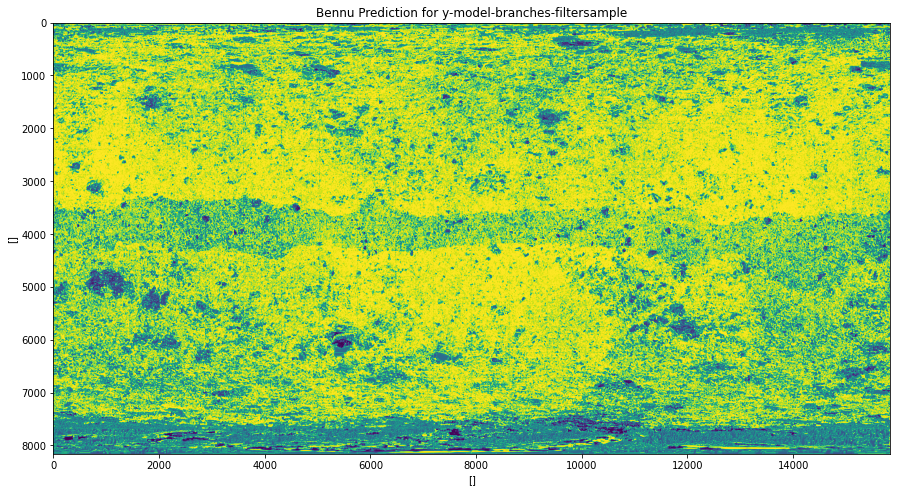

In [13]:
results_mosaic = results_mosaic_forced_size(results=results, model_name=model_name)

In [14]:
results_mosaic_final = np.zeros((results_mosaic.shape[0], results_mosaic.shape[1], 3))
results_mosaic_final[:,:,0] = results_mosaic[:,:,0]
results_mosaic_final[:,:,1] = 0
results_mosaic_final[:,:,2] = 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


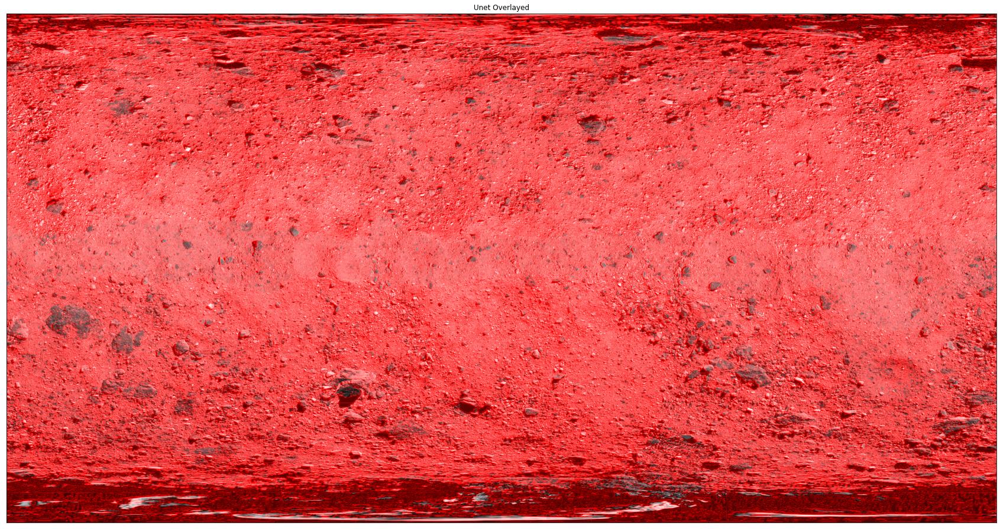

In [15]:
overlay_mosaic = results_mosaic_final + mosaic_resized_color
overlay_mosaic[overlay_mosaic>255.] = 255.
plt.figure(figsize=[30,30])
plt.imshow(overlay_mosaic)
plt.title("Unet Overlayed")
plt.xticks([])
plt.yticks([])
plt.show()

### individual photos

In [16]:
single_photos = os.listdir('C:/SynologyDrive/Programming/msds-thesis-data/data-ml/split-data')[1:]
input_img_paths_single = ['C:/SynologyDrive/Programming/msds-thesis-data/data-ml/split-data/'+photo for photo in single_photos]

In [17]:

test_generator_single = artificial_lunar_landscapes_processsed(
    batch_size=batch_size,
    image_size=image_size,
    input_img_paths=input_img_paths_single,
    input_img_processed_paths=input_img_paths_single,
    image_processed_size=image_size,
)

test_generator_single_color = artificial_lunar_landscapes(
    batch_size=batch_size,
    image_size=image_size_color,
    input_img_paths=input_img_paths_single,
    color_mode='rgb'
)

IMAGE TO BE CHANGED:  (1766, 2436, 1)


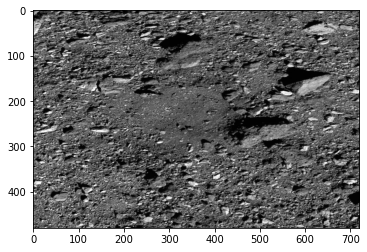

IMAGE TO BE CHANGED:  (1752, 2413, 1)


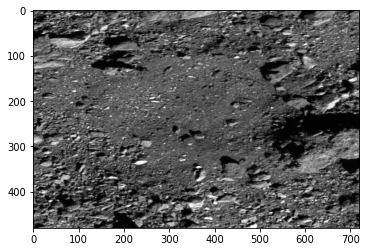

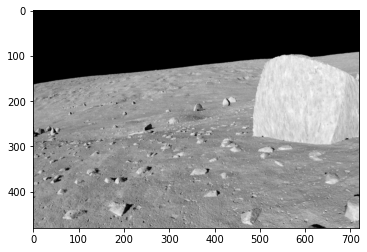

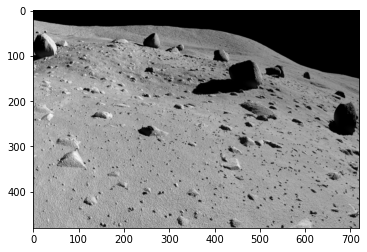

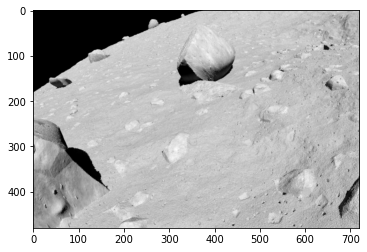

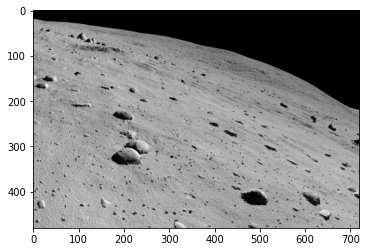

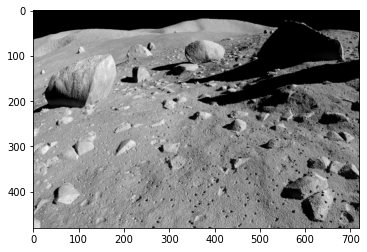

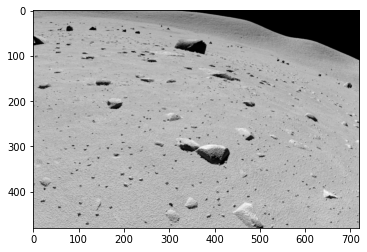

In [18]:
for img in test_generator_single:
    plt.imshow(img[0][0], cmap='gray')
    plt.show()

In [19]:
model_predictions = model.predict(test_generator_single)

IMAGE TO BE CHANGED:  (1766, 2436, 1)
IMAGE TO BE CHANGED:  (1766, 2436, 1)
IMAGE TO BE CHANGED:  (1752, 2413, 1)


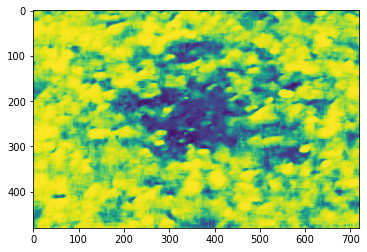

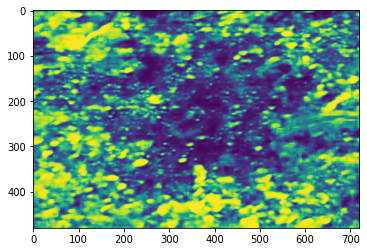

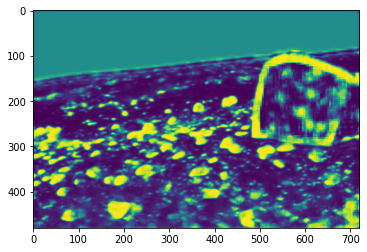

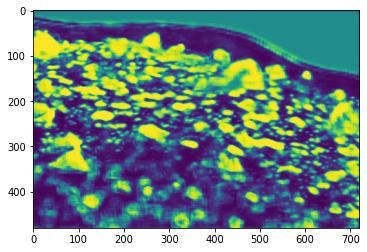

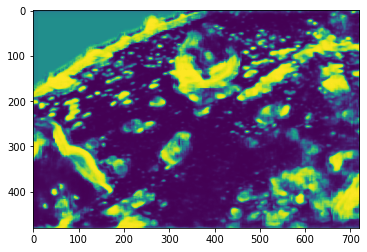

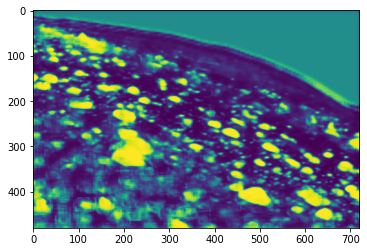

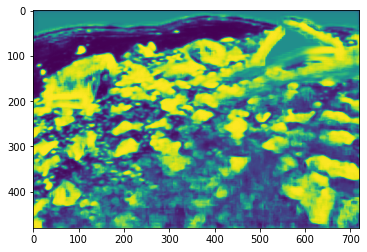

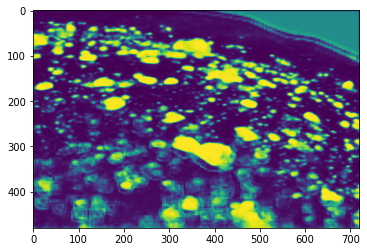

In [20]:
for img_index in range(model_predictions.shape[0]):
    plt.imshow(model_predictions[img_index][:,:,0])
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


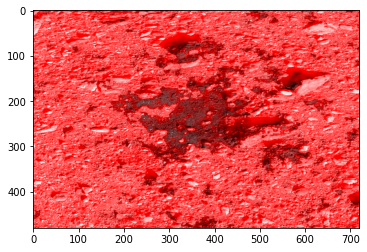

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


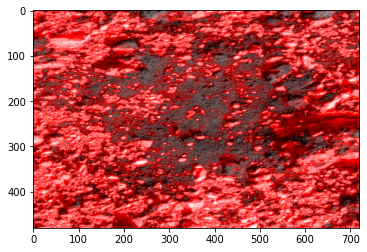

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


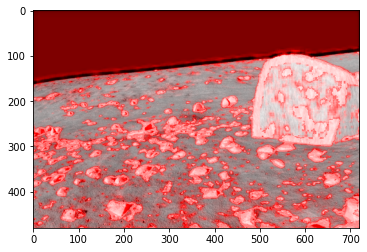

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


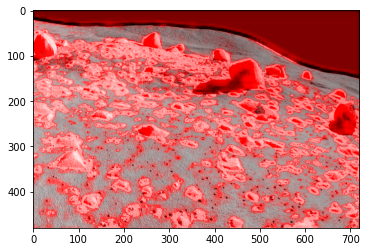

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


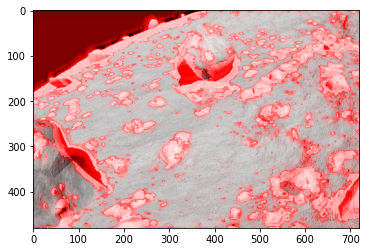

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


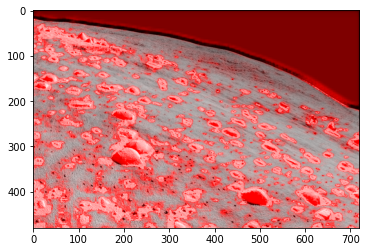

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


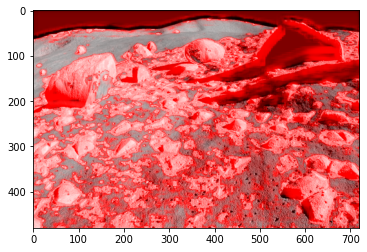

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


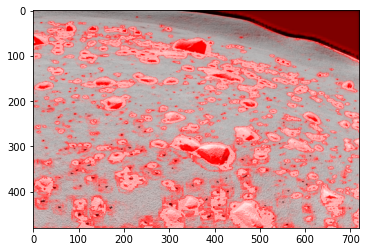

In [21]:
for img_index in range(model_predictions.shape[0]):
    single_image = model_predictions[img_index][:,:,0]
    img_og = test_generator_single_color[img_index]
    img_og = np.copy(img_og)

    darken_pixels = np.copy(single_image)
    darken_pixels[darken_pixels>0.5] = 0.05 
    #darken_pixels[darken_pixels!=1] = 0.25
    #darken_pixels[darken_pixels==1] = 0

    img_og[0,:,:,0] = img_og[0,:,:,0] + single_image
    
    img_og[0,:,:,1] = img_og[0,:,:,1] - darken_pixels
    img_og[0,:,:,2] = img_og[0,:,:,2] - darken_pixels
    plt.imshow(img_og[0])
    plt.show()